In [151]:
import tensorflow as tf
from keras.layers import Dense, Conv2D, BatchNormalization, MaxPooling2D, Input, Flatten, Dropout, LeakyReLU, ActivityRegularization, BatchNormalization
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from sklearn.preprocessing import LabelBinarizer
import keras
from keras import regularizers
from keras.models import Sequential, Model
from keras.callbacks import EarlyStopping, ModelCheckpoint
import random
from keras.applications import EfficientNetB0
import pandas as pd
import seaborn as sns
import warnings

warnings.filterwarnings("ignore", "use_inf_as_na")

rs = 7284

np.random.seed(rs)
random.seed(rs)
tf.random.set_seed(rs)

## What I've learned - BB

The biggest problem with the model seems to be that the model is learning the "noise" too well. This seems to be largely because of the quality of the pictures. Because the images were highly detailed, the model was picking up on things that weren't actually relevant making it terrible at generalizing. After messing around with a lot of different things here's what seemed to actually help the model:

Progressive resizing: Training the model on a lower quality version of the picture first and then feeding those weights to the larger model helped it learn more general features instead of learning the noise

Keeping nodes/filters at the beginning smaller: I think adding a lot of nodes at the beginning was pulling out features that weren't actually relevant and then those were getting pulled through the model. I tried variaous combinations of 16/32/64/128 and the model with only 16 nodes at the beginning performed much better than the one with 128.  

# Load Data

Using subset I created with 50 species and 100 images each for the train data, and 5 each for the val and test data. Code for creating that dataset is in my 'brendon_test_file' codebook, but a couple notes on that:

- One of the birds that got selected was "Looney Birds" which are...not birds. I manually replaced that one with "HORNED GUAN"
- Toucan was mispelled as "Touchan" so I renamed that file. 

In [2]:
# Set file path for loading data
train_dir = "/Users/sean/Documents/University_of_denver/Deep Learning/Final Project/Data/20_birds/train"
val_dir = "/Users/sean/Documents/University_of_denver/Deep Learning/Final Project/Data/20_birds/val"
test_dir = "/Users/sean/Documents/University_of_denver/Deep Learning/Final Project/Data/20_birds/test"

In [3]:
# Set the number of images per bird to include
num_img = 100
num_birds = 20

# Instantiate the containers for holding image and label data
train_data = []
val_data = []
test_data = []

bird_num = 0
# Load train data
for i in os.listdir(train_dir):
    bird_num +=1
    if bird_num > num_birds:
        break
    count = 0
    sub_directory = os.path.join(train_dir, i)
    for j in os.listdir(sub_directory):
        count+=1
        if count > num_img:
            break
        img = cv2.imread(os.path.join(sub_directory, j))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        train_data.append([img, i])
    
            
bird_num = 0
# Load validation data
for i in os.listdir(val_dir):
    bird_num += 1
    if bird_num > num_birds:
        break
    sub_directory = os.path.join(val_dir, i)
    for j in os.listdir(sub_directory):
        img = cv2.imread(os.path.join(sub_directory, j))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        val_data.append([img, i])

bird_num = 0
#Load test data
for i in os.listdir(test_dir):
    bird_num += 1
    if bird_num > num_birds:
        break
    sub_directory = os.path.join(test_dir, i)
    for j in os.listdir(sub_directory):
        img = cv2.imread(os.path.join(sub_directory, j))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        test_data.append([img, i])

print(len(train_data))
print(len(val_data))
print(len(test_data))

2000
100
100


In [4]:
bird_names = os.listdir(train_dir)[:num_birds]

In [5]:
# Check if all images are the same shape

count_t = 0
count_v = 0

for t in train_data:
    if t[0].shape != (224, 224, 3):
        count_t += 1
    
for v in val_data:
    if v[0].shape != (224, 224, 3):
        count_v += 1

print(f'There are {count_t} images of different shape in the train data.\nThere are {count_v} images of different shape in the validation data.')
    

There are 0 images of different shape in the train data.
There are 0 images of different shape in the validation data.


# Explore Data

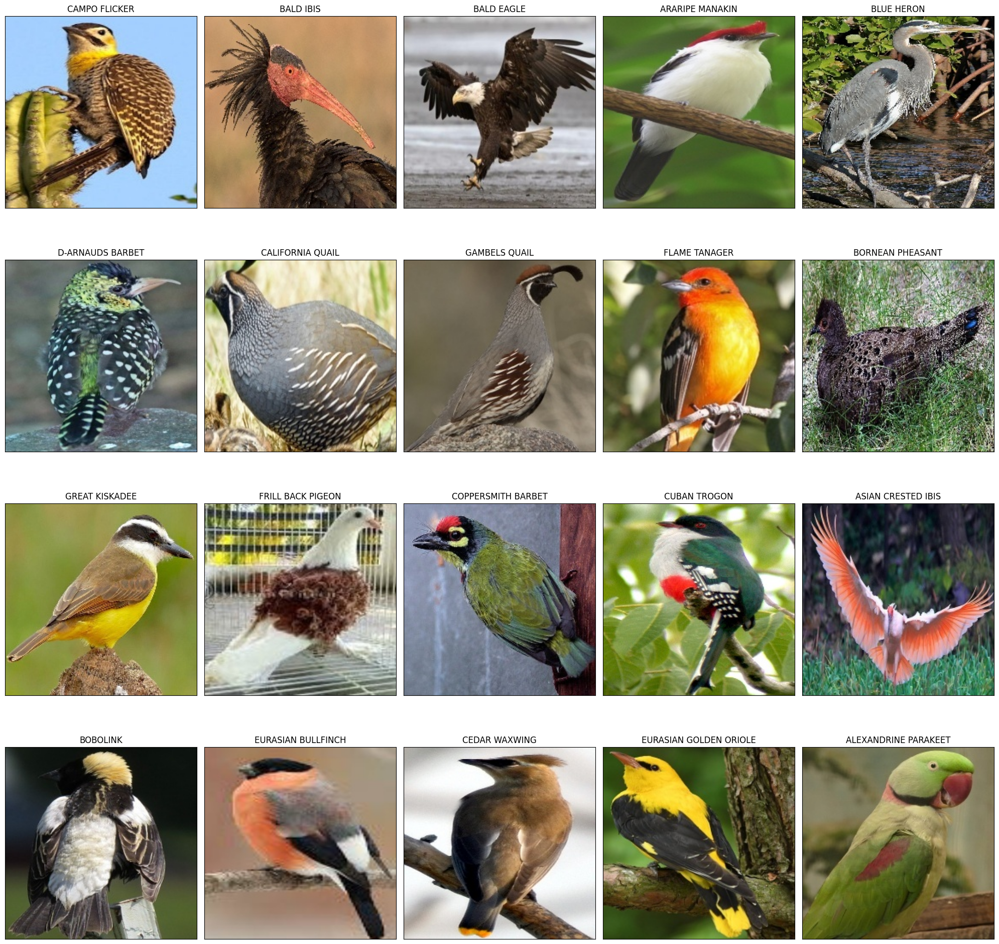

In [6]:
# Show an image for each bird
fig, axs = plt.subplots(int(num_birds/5), 5, figsize=(20, 20))

axs = axs.ravel()

ax = 0
for idx in np.arange(0, num_birds*num_img, num_img):
    bird = train_data[idx][1]
    img = train_data[idx][0]
    axs[ax].xaxis.set_ticks([])
    axs[ax].yaxis.set_ticks([])
    axs[ax].set_title(bird)
    # Note that cv2 reads images in BGR, but plt.imshow is expecting RGB, cvtColor reverses the channels so the correct color is shown when plotted. 
    axs[ax].imshow(img)
    ax +=1

plt.tight_layout()
plt.show()

# Preapre Data for Training

In [7]:
# Shuffle data to randomize batches

np.random.seed(rs)
np.random.shuffle(train_data)
np.random.shuffle(val_data)

In [8]:
# Preprocess training data and validation data
lb = LabelBinarizer()

X_train = []
y_train = []
for x, y in train_data:
    X_train.append(x)
    y_train.append(y)

X_train = np.array(X_train)
y_train = np.array(y_train)

y_train_vect = lb.fit_transform(y_train)

X_val = []
y_val = []
for x, y in val_data:
    X_val.append(x)
    y_val.append(y)

X_val = np.array(X_val)
y_val = np.array(y_val)

y_val_vect = lb.fit_transform(y_val)

# Function Creation

In [9]:
def set_callbacks(filename, patience= 8, start_from_eopch= 10):

    '''Sets early stopping and model checkpoint variables
    
        Args:
            filename (str): Filename/path for saving
            patience (int): How many epochs to wait before stopping (default 8)
            start_from_epoch (int): What epoch to start checking validation accuracy (default 10)

        Returns:
            stopping: EarlyStopping call
            checkpoint: ModelCheckpoint call
    '''

    stopping = EarlyStopping(monitor= 'val_accuracy', patience= 8, start_from_epoch=10, restore_best_weights= True)
    checkpoint = ModelCheckpoint(filename, monitor = 'val_accuracy', save_best_only= True)

    return stopping, checkpoint

def plot_loss (mod_hist):

    '''Plots the loss and accuracy for model training
    
        Args:
            mod_hist: History results from a model.fit() call
    '''

    results_df = pd.DataFrame({'Train Accuracy': mod_hist.history['accuracy'],
                           'Val Accuracy': mod_hist.history['val_accuracy'],
                           'Train Loss': mod_hist.history['loss'],
                           'Val Loss': mod_hist.history['val_loss']
                           })

    fig, axs = plt.subplots(ncols=2, figsize = (12, 4))

    sns.lineplot(results_df['Val Loss'], ax= axs[0], label = 'Val Loss')
    sns.lineplot(results_df['Train Loss'], ax= axs[0], label = 'Train Loss')

    sns.lineplot(results_df['Val Accuracy'], ax= axs[1], label = 'Val Acc')
    sns.lineplot(results_df['Train Accuracy'], ax= axs[1], label = 'Train Acc')

    # axs[1].set_yticks(np.arange(.1, 1.01, .05))
    # axs[0].set_yticks(np.arange(0, 5.1, .2))

    plt.legend()

    plt.show()

def model_setup(rs=7284):
    '''Sets the 3 seeds necessary for consistency in keras'''
    np.random.seed(rs)
    random.seed(rs)
    tf.random.set_seed(rs)
    
def resize_img(X_train ,X_val, new_size):
    '''Resizes an array of images

        Args:
            X_train (array): Array of image data for training
            X_val (array): Array of img data for validation
            new_size (tuple): The shape to resize the images to

        Returns:
            X_train_rs (array): An array of the same length as X_train with images resized
            X_val_rs (array): An array of the same length as X_val with images resized

    '''
    X_train_rs = []
    X_val_rs = []

    #Resize training data
    for img in X_train:
        rsimg = cv2.resize(img, new_size)
        X_train_rs.append(rsimg)

    X_train_rs = np.array(X_train_rs)

    # Resize validation data
    for img in X_val:
        rsimg = cv2.resize(img, new_size)
        X_val_rs.append(rsimg)

    X_val_rs = np.array(X_val_rs)

    return X_train_rs, X_val_rs

def pred_eval(model, X = X_val, y= y_val):

    ''' Evaluates predictions for specificed model

        Args:
            model: The model to be used for predictions

        Returns:
            preds (df): A dataframe of the ground truth and predicted class labels for each observation
    
    '''
     
    predictions = np.argmax(model.predict(X), axis=1)

    y_hat = np.array([bird_names[i] for i in predictions])

    preds = pd.DataFrame({'y_true': y,
                                'y_hat': y_hat
                                })
    
    return preds

def count_correct(preds):

    '''Creates a dummary dataframe counting the total correct predictions for each bird species
    
        Args:
            preds (df): The output dataframe from pred_eval()

        Returns:
            correct_count(df): A dataframe with each bird name and the total number correctly predicted
    '''

    # Look at number of correct predictions for each bird
    preds['Correct'] = preds.apply(lambda x: 0 if x['y_true'] != x['y_hat'] else 1, axis= 1)

    correct_count = pd.DataFrame(preds.groupby(by='y_true').sum()['Correct'])

    return correct_count

def show_class(bird, preds):

    '''Shows validation images and predicted class for specified species, divided by incorrect and correct if applicable

        Args:
            bird (str): Name of bird to show
            preds (df): The output dataframe from pred_eval()
    '''

    # List the indexes for the worst bird correctly and incorrectly predicted and show images
    wrong_bird = list(preds[(preds['y_true'] == bird) & (preds['y_hat'] != bird)].index)
    right_bird = list(preds[(preds['y_true'] == bird) & (preds['y_hat'] == bird)].index)

    if len(wrong_bird) > 0:

        print(f'Incorrectly labeled {bird}')
        fig, axs = plt.subplots(ncols=len(wrong_bird), figsize = (15, 5))

        for idx, i in enumerate(wrong_bird):
            if len(wrong_bird) > 1:
                ax = axs[idx]
            elif len(wrong_bird) <= 1:
                ax = axs

            ax.imshow(X_val[i])
            ax.xaxis.set_ticks([])
            ax.xaxis.set_ticks([])
            ax.set_title(preds['y_hat'][i])
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()

    if len(right_bird) > 0: 

        print(f'Correctly labeled {bird}')

        fig, axs = plt.subplots(ncols=len(right_bird), figsize = (10, 5))

        for idx, i in enumerate(right_bird):

            if len(right_bird) > 1:
                ax = axs[idx]
            elif len(right_bird) <= 1:
                ax = axs

            ax.imshow(X_val[i])
            ax.xaxis.set_ticks([])
            ax.xaxis.set_ticks([])
            ax.set_title(preds['y_hat'][i])
            ax.axis('off')
            
        plt.tight_layout()
        plt.show()

def plot_birds(birds, num_show):
    '''Shows the selected number of images from teh training set for the selected species of birds
    
        Args:
            birds (list): A list of the name(s) of bird(s) that you want to show
            num_show(int): The number of images to show for each species
    '''
    for bird in birds:
        fig, axs = plt.subplots(ncols= num_show, figsize = (20, 5))

        bird_imgs = X_train[y_train == bird][:num_show]

        for idx, b in enumerate(bird_imgs):

            axs[idx].imshow(b)
            axs[idx].xaxis.set_ticks([])
            axs[idx].xaxis.set_ticks([])
            axs[idx].axis('off')
            
        fig.suptitle(bird)
        plt.tight_layout()
        plt.show()


# Simple Model

Check simple model to evaluate baseline accuracy. Same parameters as the one from the basline we submitted

In [10]:
warnings.filterwarnings("ignore", "tensorflow")

keras.backend.clear_session()
model_setup()

inputs = Input(shape=(224, 224, 3))

cnn1 = Conv2D(32, 3, activation="leaky_relu")(inputs)

pool1 = MaxPooling2D(2)(cnn1)

flat = Flatten()(pool1)

predictions = Dense(num_birds, activation='softmax')(flat)

simp_model = Model(inputs=inputs, outputs=predictions)

simp_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 394272)            0         
                                                                 
 dense (Dense)               (None, 20)                7885460   
                                                                 
Total params: 7886356 (30.08 MB)
Trainable params: 7886356 (30.08 MB)
Non-trainable params: 0 (0.00 Byte)
_____________________

In [114]:
# Fit model
stopping, checkpoint = set_callbacks('simple_model.keras')

simp_model.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

simp_history = simp_model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 0, epochs = 15, callbacks=[stopping, checkpoint])

simp_model.evaluate(X_val/255, y_val_vect)

4/4 [==============================] - 0s 26ms/step - loss: 1.1002 - accuracy: 0.7200


[1.1002271175384521, 0.7200000286102295]

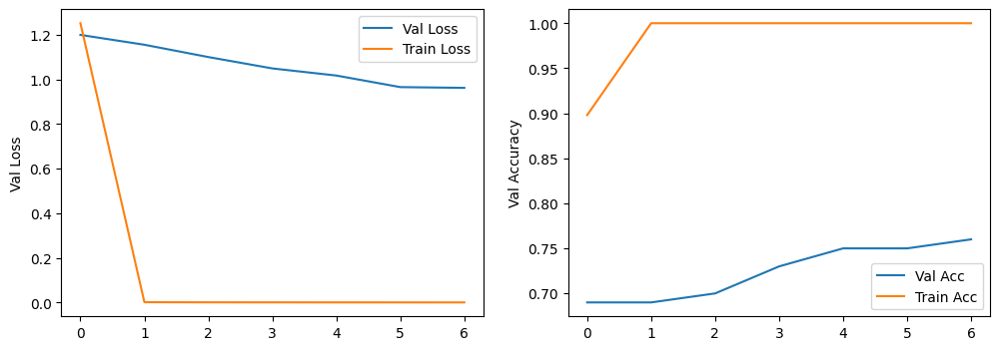

In [13]:
# Look at epoch loss/accuracy
plot_loss(simp_history)

In [14]:
preds = pred_eval(simp_model)
correct_count = count_correct(preds)

correct_count.sort_values(by='Correct')

4/4 [==============================] - 0s 28ms/step


,Correct
y_true,
ALEXANDRINE PARAKEET,0
FRILL BACK PIGEON,0
FLAME TANAGER,0
EURASIAN GOLDEN ORIOLE,0
EURASIAN BULLFINCH,0
D-ARNAUDS BARBET,0
CUBAN TROGON,0
COPPERSMITH BARBET,0
CEDAR WAXWING,0


Incorrectly labeled BALD EAGLE


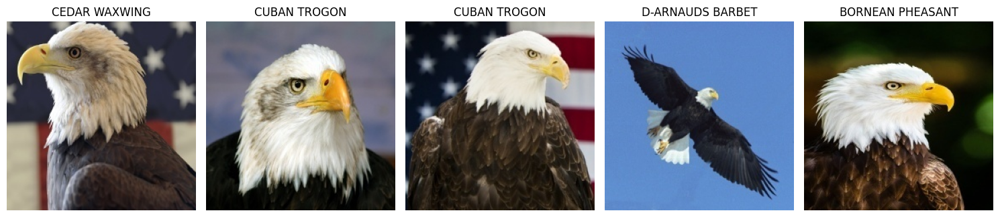

Incorrectly labeled BLUE HERON


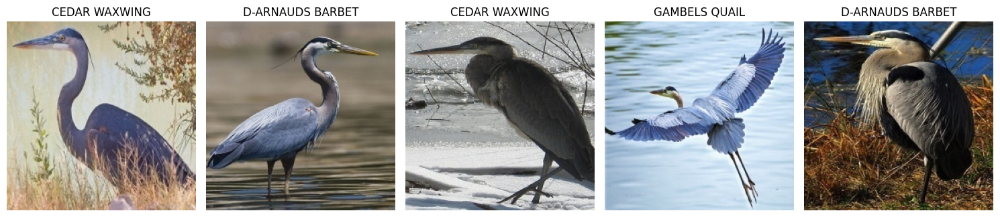

In [15]:
show_class('BALD EAGLE', preds)

show_class('BLUE HERON', preds)

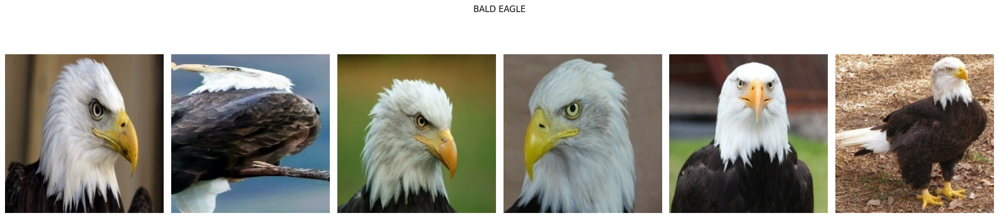

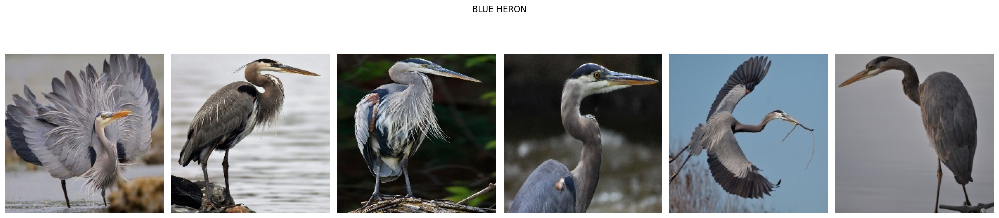

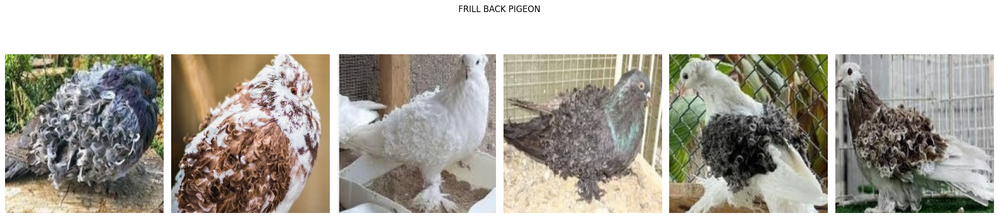

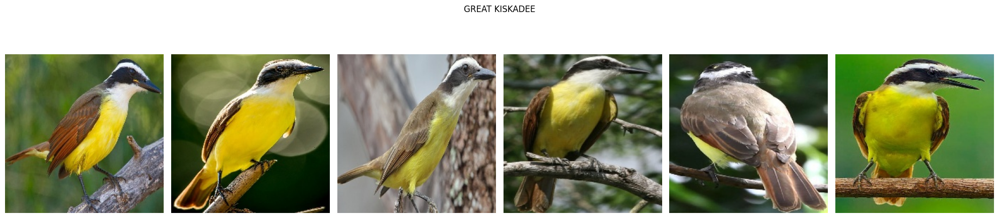

In [16]:
plot_birds(['BALD EAGLE', 'BLUE HERON', 'FRILL BACK PIGEON', 'GREAT KISKADEE'], 6)

Incorrectly labeled CUBAN TROGON


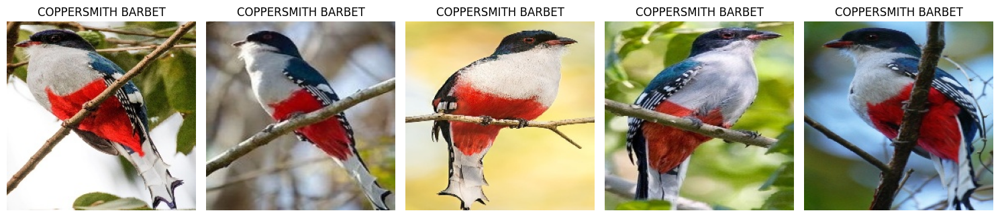

Incorrectly labeled CAMPO FLICKER


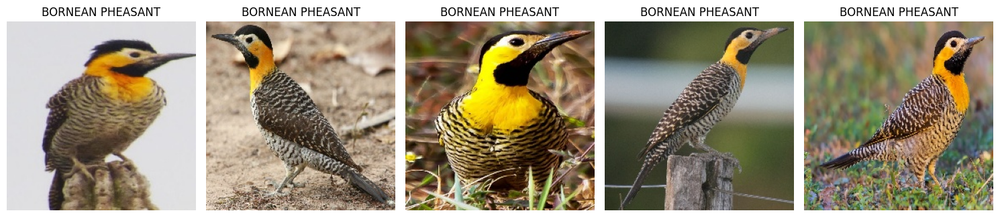

Incorrectly labeled GAMBELS QUAIL


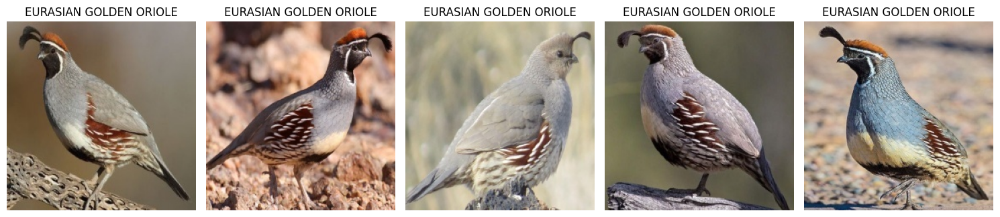

In [17]:
# Look at correctly classified birds

show_class('CUBAN TROGON', preds)
show_class('CAMPO FLICKER', preds)
show_class('GAMBELS QUAIL', preds)

## Findings

Looking at a sampling of images from the most poorly and best predicted classes, it's hard to figure out why these are getting predicted the way they are. There are some coloration simialrities between bald eagles and frill back pigeons, but the great kiskadee doesn't seem to ahve anything in common. 

This probably means our model is probably learning some features that aren't obvious to a human eye. And given how simple the model is, it's likley that it's not differentiating the images enough to discern how those features are different across birds. 

To try and add some more complexity, I will add a few mores layer to the model However, the simple model is already overfitting pretty early in the process, so we'll need to adjust the model to counteract that. So I will also add a dropout layer.

## Greyscale model

#### Thoughts
One thought when looking to see if the model is learning the color patterns to well was to look at the greyscale of the images. I think this could be interesting. As I think about it more im unsure if it will make a huge difference as the model isnt percieving the color just the large variation in numbers of the matrix, will converting this to greyscale change that?

In [117]:
# Set the number of images per bird to include
num_img = 100
num_birds = 20

# Instantiate the containers for holding image and label data
grey_train_data = []
grey_val_data = []
grey_test_data = []

bird_num = 0
# Load train data
for i in os.listdir(train_dir):
    bird_num +=1
    if bird_num > num_birds:
        break
    count = 0
    sub_directory = os.path.join(train_dir, i)
    for j in os.listdir(sub_directory):
        count+=1
        if count > num_img:
            break
        img = cv2.imread(os.path.join(sub_directory, j))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = np.expand_dims(img, axis=-1)
        grey_train_data.append([img, i])
    
            
bird_num = 0
# Load validation data
for i in os.listdir(val_dir):
    bird_num += 1
    if bird_num > num_birds:
        break
    sub_directory = os.path.join(val_dir, i)
    for j in os.listdir(sub_directory):
        img = cv2.imread(os.path.join(sub_directory, j))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = np.expand_dims(img, axis=-1)
        grey_val_data.append([img, i])

bird_num = 0
#Load test data
for i in os.listdir(test_dir):
    bird_num += 1
    if bird_num > num_birds:
        break
    sub_directory = os.path.join(test_dir, i)
    for j in os.listdir(sub_directory):
        img = cv2.imread(os.path.join(sub_directory, j))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = np.expand_dims(img, axis=-1)
        grey_test_data.append([img, i])

print(len(grey_train_data))
print(len(grey_val_data))
print(len(grey_test_data))

2000
100
100


In [118]:
# image shape should only have the single color channel
print(grey_train_data[0][0].shape)

# Check if all images are the same shape

count_t = 0
count_v = 0

for t in grey_train_data:
    if t[0].shape != (224, 224,1):
        count_t += 1
    
for v in grey_val_data:
    if v[0].shape != (224, 224,1):
        count_v += 1

print(f'There are {count_t} images of different shape in the train data.\nThere are {count_v} images of different shape in the validation data.')

(224, 224, 1)
There are 0 images of different shape in the train data.
There are 0 images of different shape in the validation data.


In [119]:
# prep greyscale data
# Shuffle data to randomize batches
np.random.seed(rs)
np.random.shuffle(grey_train_data)
np.random.shuffle(grey_val_data)

X_grey_train = []
y_grey_train = []
for x, y in grey_train_data:
    X_grey_train.append(x)
    y_grey_train.append(y)

X_grey_train = np.array(X_grey_train)
y_grey_train = np.array(y_grey_train)

y_grey_train_vect = lb.fit_transform(y_grey_train)

X_grey_val = []
y_grey_val = []
for x, y in grey_val_data:
    X_grey_val.append(x)
    y_grey_val.append(y)

X_grey_val = np.array(X_grey_val)
y_grey_val = np.array(y_grey_val)

y_grey_val_vect = lb.fit_transform(y_grey_val)

In [141]:
warnings.filterwarnings("ignore", "tensorflow")
keras.backend.clear_session()
model_setup()

inputs = Input(shape=(224, 224, 1))

cnn1 = Conv2D(32, 1, activation="leaky_relu")(inputs)

pool1 = MaxPooling2D(2)(cnn1)

flat = Flatten()(pool1)

predictions = Dense(num_birds, activation='softmax')(flat)

grey_model = Model(inputs=inputs, outputs=predictions)

grey_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      64        
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 401408)            0         
                                                                 
 dense (Dense)               (None, 20)                8028180   
                                                                 
Total params: 8028244 (30.63 MB)
Trainable params: 8028244 (30.63 MB)
Non-trainable params: 0 (0.00 Byte)
_____________________

In [142]:
# Fitting the greyscale model

stopping, checkpoint = set_callbacks('grey_model.keras')

grey_model.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

grey_history = grey_model.fit(x = X_grey_train/255, y= y_grey_train_vect, batch_size=128, validation_data= (X_grey_val/255, y_grey_val_vect), verbose = 0, epochs = 100,callbacks=[stopping, checkpoint])

#print(grey_history.history.keys())
max_val = max(grey_history.history['val_accuracy'])
max_train = max(grey_history.history['accuracy'])

print(f'The maximum traing accuracy was {round(max_train,3)} \nThe maximum validation accuracy was {round(max_val,3)} ')

The maximum traing accuracy was 1.0 
The maximum validation accuracy was 0.44 


## Introducing regularization to the greyscale model

In [149]:
warnings.filterwarnings("ignore", "tensorflow")
keras.backend.clear_session()
model_setup()

inputs = Input(shape=(224, 224, 1))
cnn1 = Conv2D(32, 1, activation="leaky_relu")(inputs)
cnn1 = ActivityRegularization(l1=0.01)(cnn1)
pool1 = MaxPooling2D(2)(cnn1)
flat = Flatten()(pool1)
predictions = Dense(num_birds, activation='softmax')(flat)
grey_2 = Model(inputs=inputs, outputs=predictions)
grey_2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      64        
                                                                 
 activity_regularization (A  (None, 224, 224, 32)      0         
 ctivityRegularization)                                          
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 401408)            0         
                                                                 
 dense (Dense)               (None, 20)                802818

In [150]:
# Fitting the greyscale model

stopping, checkpoint = set_callbacks('grey_2.keras')

grey_2.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

grey_2_hist = grey_2.fit(x = X_grey_train/255, y= y_grey_train_vect, batch_size=100, validation_data= (X_grey_val/255, y_grey_val_vect), verbose = 0, epochs = 100,callbacks=[stopping, checkpoint])

#print(grey_history.history.keys())
max_val = max(grey_2_hist.history['val_accuracy'])
max_train = max(grey_2_hist.history['accuracy'])

print(f'The maximum traing accuracy was {round(max_train,3)} \nThe maximum validation accuracy was {round(max_val,3)} ')

The maximum traing accuracy was 0.718 
The maximum validation accuracy was 0.46 


In [154]:
grey_2_hist.history

{'loss': [970.3095092773438,
  671.2937622070312,
  510.566650390625,
  381.0417175292969,
  274.2906188964844,
  194.2670135498047,
  140.68951416015625,
  109.9454574584961,
  94.0062255859375,
  84.32621765136719,
  75.2989730834961,
  66.66075134277344,
  57.91083908081055,
  49.1320686340332,
  41.22630310058594,
  34.24766540527344,
  27.543556213378906,
  21.41388702392578,
  16.36005973815918],
 'accuracy': [0.0494999997317791,
  0.1014999970793724,
  0.12849999964237213,
  0.1875,
  0.30300000309944153,
  0.3684999942779541,
  0.47350001335144043,
  0.5575000047683716,
  0.5805000066757202,
  0.6000000238418579,
  0.6384999752044678,
  0.6819999814033508,
  0.6809999942779541,
  0.7114999890327454,
  0.7179999947547913,
  0.7085000276565552,
  0.7095000147819519,
  0.6474999785423279,
  0.5920000076293945],
 'val_loss': [807.3831787109375,
  597.3223876953125,
  455.6788635253906,
  331.6522521972656,
  236.04629516601562,
  167.1403350830078,
  124.9560317993164,
  102.124557

## Batch Normalization

In [152]:
warnings.filterwarnings("ignore", "tensorflow")
keras.backend.clear_session()
model_setup()

inputs = Input(shape=(224, 224, 1))
cnn1 = Conv2D(32, 1, activation="leaky_relu")(inputs)
cnn1 = BatchNormalization(epsilon=0.001)(cnn1)
pool1 = MaxPooling2D(2)(cnn1)
flat = Flatten()(pool1)
predictions = Dense(num_birds, activation='softmax')(flat)
grey_3 = Model(inputs=inputs, outputs=predictions)
grey_3.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      64        
                                                                 
 batch_normalization (Batch  (None, 224, 224, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 401408)            0         
                                                                 
 dense (Dense)               (None, 20)                802818

In [153]:
# Fitting the greyscale model

stopping, checkpoint = set_callbacks('grey_2.keras')

grey_3.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

grey_3_hist = grey_3.fit(x = X_grey_train/255, y= y_grey_train_vect, batch_size=100, validation_data= (X_grey_val/255, y_grey_val_vect), verbose = 0, epochs = 100,callbacks=[stopping, checkpoint])

#print(grey_history.history.keys())
max_val = max(grey_3_hist.history['val_accuracy'])
max_train = max(grey_3_hist.history['accuracy'])

print(f'The maximum traing accuracy was {round(max_train,3)} \nThe maximum validation accuracy was {round(max_val,3)} ')

The maximum traing accuracy was 0.893 
The maximum validation accuracy was 0.15 


In [155]:
grey_3_hist.history['val_accuracy']

[0.07999999821186066,
 0.05999999865889549,
 0.07999999821186066,
 0.07000000029802322,
 0.10000000149011612,
 0.07999999821186066,
 0.07999999821186066,
 0.10000000149011612,
 0.07999999821186066,
 0.07999999821186066,
 0.09000000357627869,
 0.15000000596046448,
 0.09000000357627869,
 0.05999999865889549,
 0.07999999821186066,
 0.07999999821186066,
 0.07000000029802322,
 0.15000000596046448,
 0.10999999940395355,
 0.10999999940395355]

# Model Complexity Test

In [ ]:
keras.backend.clear_session()
model_setup()

comp_model = Sequential()

comp_model.add(Conv2D(32, 3, activation='leaky_relu', input_shape=(224, 224, 3)))

comp_model.add(MaxPooling2D(2))

comp_model.add(Conv2D(32, 3, activation='leaky_relu'))

comp_model.add(MaxPooling2D(2))

comp_model.add(Dropout(.2))

comp_model.add(Flatten())

comp_model.add(Dense(128, activation='leaky_relu'))

comp_model.add(Dense(num_birds, activation='softmax'))

comp_model.summary()

In [ ]:
stopping, checkpoint = set_callbacks('complex_model.keras')

comp_model.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

comp_history = comp_model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[stopping, checkpoint])

comp_model.evaluate(X_val/255, y_val_vect)

In [ ]:
## Best model for 224 data so far
# warnings.filterwarnings("ignore", "tensorflow")

# keras.backend.clear_session()
# model_setup()

# inputs = Input(shape=(224, 224, 3))

# cnn1 = Conv2D(64, 3, activation="leaky_relu")(inputs)

# pool1 = MaxPooling2D(2)(cnn1)

# cnn2 = Conv2D(32, 3, activation="leaky_relu")(pool1)

# pool3 = MaxPooling2D(2)(cnn2)

# cnn3 = Conv2D(32, 3, activation='leaky_relu')(pool3)

# pool2 = MaxPooling2D(2)(cnn3)

# dp1 = Dropout(.5)(pool2)

# flat = Flatten()(dp1)

# dense1 = Dense(256, activation='leaky_relu')(flat)

# predictions = Dense(num_birds, activation='softmax')(dense1)

# comp_model = Model(inputs=inputs, outputs=predictions)

# comp_model.summary()

In [ ]:
plot_loss(comp_history)

In [ ]:
preds = pred_eval(comp_model)
correct = count_correct(preds)

correct.sort_values('Correct')

In [ ]:
show_class('BALD EAGLE', preds)

show_class('BALD IBIS', preds)

In [ ]:
plot_birds(['BALD EAGLE', 'ASIAN CRESTED IBIS', 'CALIFORNIA QUAIL', 'ALEXANDRINE PARAKEET', 'CEDAR WAXWING', 'CAMPO FLICKER', 'COPPERSMITH BARBET'], 6)

## Findings

While this update did not improve accuracy, it did help our model make better predictions in the aggregate since we now have at least 1 picture from every class being correctly predicted. 

Based on the images, it does look like there may be more pictures of the Asian Crested Ibis flying than other birds, and so that could explain why the model predicted that for the flying eagle picture.

Others are still a little odd, such as the Bald Ibis being confused with a Campo Flicker. So it appears our model is still getting hung up on some features that a human wouldn't pick up on.

Again, increasing the complexity of the model could be a good way to draw out more features, but even with the dropout layer, our model is hitting 100% training accuracy pretty quickly. If we removed early stopping it's possible teh dropout would help us hit on a better accuracy, but I suspect for some fo these birds we don't have enough or the right information.

While we do have more data that we could pull in, I'd like to avoid doing that since it feels like too easy of a solution for this project. Instead, I'd like to attempt a method that will help us "fake" more data and also reduce the issue of overfitting. 

# Progressive Resizing Experiment

Progressive resiziing is a learning technique where the existing images are reduced in size and a model is trained on the smaller images. That model is then pregressively chained with models trained on larger images. The scaled iamges are seen as "new" images by the model, which helps us increase our dataset size, and because the smaller images have fewer details it helps prevent the model from overlearning the "noise" in the higher quality images.

## 56x56

I'm going to take the more complex model that I jsut tested, and rebuild it to take 56x56 images. I'll add one more CNN layer, set padding to same, and remove early stopping so that I can see how much teh dropout layer is helping overfitting

In [ ]:
# Resize imags to 56x56

X_train_56, X_val_56 = resize_img(X_train, X_val, (56, 56))

# Compare to original data
plt.imshow(X_train_56[5])
plt.show()

plt.imshow(X_train[5])
plt.show()

In [ ]:
# Just running a couple epochs on baseline to validate that it should still be able to get decent results
from keras.applications import EfficientNetB0

keras.backend.clear_session()

# Load Model 
enet = EfficientNetB0(include_top= False, input_shape=(56, 56, 3), weights= 'imagenet')

layers = enet.layers

for layer in layers:
    layer.trainable = False

# Add a flatten and softmax layer
base_model= Sequential([
    enet,
    Flatten(),
    Dense(num_birds, activation='softmax')
])

# Compile model
base_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

base_history = base_model.fit(x = X_train_56, y= y_train_vect, batch_size=80, validation_data= (X_val_56, y_val_vect), verbose = 1, epochs = 2)

In [ ]:
# Create model to train 56x56 images

keras.backend.clear_session()
model_setup()

model = Sequential()

# Need to add 2nd conv2D layer so that it can become the new input layer, setting padding as same to maintain matrix sizes
model.add(Conv2D(32, 3, activation='leaky_relu', padding='same', input_shape=(56, 56, 3)))

model.add(Conv2D(32, 3, activation='leaky_relu', padding='same'))

model.add(MaxPooling2D(2))

model.add(Conv2D(32, 3, activation='leaky_relu'))

model.add(MaxPooling2D(2))

model.add(Dropout(.2))

model.add(Flatten())

model.add(Dense(128, activation='leaky_relu'))

model.add(Dense(num_birds, activation='softmax'))

model.summary()

In [ ]:
# Set callbacks

stopping, checkpoint = set_callbacks('model_56.keras', patience=20)

model.compile(optimizer='RMSProp', loss='categorical_crossentropy', metrics='accuracy')

history_56 = model.fit(x = X_train_56/255, y= y_train_vect, batch_size=128, validation_data= (X_val_56/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[checkpoint])

In [ ]:
model_56 = keras.saving.load_model('model_56.keras')

model_56.evaluate(X_val_56/255, y_val_vect)

In [ ]:
preds = pred_eval(model_56, X= X_val_56)
correct = count_correct(preds)

correct.sort_values('Correct')

In [ ]:
show_class('BALD EAGLE', preds)

show_class('BALD IBIS', preds)

## 112x112

We've been able to increase our accuracy again just by training the data on scaled down images. The incorrectly labeled images for bald eagle still seem to be the same, so that hasn't gained us anything there, but it also hasn't dropped anything back to 0.

I'll now train a small model on larger images, and then link that to the 56x56 model. I'll lock the weights on the 56x56 model to try and keep the learnings. 

In [ ]:
# Resize imags to 112x112

X_train_112, X_val_112 = resize_img(X_train, X_val, (112, 112))

# Compare to original data
plt.imshow(X_train_112[5])
plt.show()

plt.imshow(X_train[5])
plt.show()

In [ ]:
model_setup()

model = Sequential()

model.add(Conv2D(64, 3, padding='same', activation='leaky_relu', input_shape=(112, 112, 3)))

model.add(Conv2D(32, 3, padding='same', activation='leaky_relu'))

model.add(MaxPooling2D(2))

model.summary()

Trainable params: 20256 (79.12 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model_56 = keras.saving.load_model('model_56.keras')

# Check size of model:
print(f'End model has {len(model_56.layers)} layers\n')

# Check input sizes for first two layers
for layer in model_56.layers[:2]:
    print(layer.input)

# Add all layers except for input layer to the new model
for layer in model_56.layers[1:]:
    model.add(layer)

# Lock weights for model_56 layers
for layer in model.layers[-10:]:
    layer.trainable = False

model.summary()

In [ ]:
# Set callbacks

stopping, checkpoint = set_callbacks('model_112.keras')

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics='accuracy')

history_112 = model.fit(x = X_train_112/255, y= y_train_vect, batch_size=128, validation_data= (X_val_112/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[checkpoint])

In [ ]:
model_112 = keras.saving.load_model('model_112.keras')

model_112.evaluate(X_val_112/255, y_val_vect)

## 224x224

We got another point of accuracy that way as well, so let's now add on the final model

In [ ]:
model_setup()

model = Sequential()

model.add(Conv2D(128, 3, padding='same', activation='leaky_relu', input_shape=(224, 224, 3)))

model.add(Conv2D(64, 3, padding='same', activation='leaky_relu'))

model.add(MaxPooling2D(2))

model.summary()

In [ ]:
model_112 = keras.saving.load_model('model_112.keras')

# Check size of model:
print(f'End model has {len(model_112.layers)} layers\n')

# Check input sizes for first two layers
for layer in model_112.layers[:2]:
    print(layer.input)

# Add all layers except for input layer to the new model
for layer in model_112.layers[1:]:
    model.add(layer)

# Lock weights for model_56 layers
for layer in model.layers[3:]:
    layer.trainable = False

model.summary()

In [ ]:
# Set callbacks

stopping, checkpoint = set_callbacks('model_224.keras')

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics='accuracy')

history_224 = model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[checkpoint])

In [ ]:
model_224 = keras.saving.load_model('model_224.keras')

model_224.evaluate(X_val/255, y_val_vect)

# Exploratory Code

Looking at the predictions, it looks like only 3 of our bird species are being correctly predicted 100%. The rest are somewhere in between 80% and 0%, with Bald Eagle being misclassified 100% of the time. I'll take a look at these images to see if I can get any insight into why this may be the case. 

In [ ]:
# Look at first 5 examples of images from the training set for blue herons and misclassified birds
birds = ['BALD EAGLE', 'ASIAN CRESTED IBIS', 'GAMBELS QUAIL', 'FRILL BACK PIGEON']

plot_birds(birds, 10)

One possible challenge is that the bald eagle validation set appears to be almost entirely headshots, while the testing set is more mixed, so it may be having trouble identifying that it's just a head. 

For other birds, based on this sample, the Asian Crested Ibis could be pictured flying more which might explain the confusion with the first picture, but otherwise these seem to be a little all over the place. This isn't surprising since the model is so simple, it's not going to have much opportunity to differentiate features so it's likely making pretty broad sweeps on features which is why it's confusing bald eagle so much. 

I am going to add mroe complexity to the model by adding a second fully connected layer ahead of teh softmax layer, and increse teh node sizes on the CNN to 32

In [ ]:
model_setup()

inputs = Input(shape=(224, 224, 3))

cnn1 = Conv2D(32, 3, activation= 'relu')(inputs)

pool1 = MaxPooling2D(2)(cnn1)

dp1 = Dropout(.2)(pool1)

flat = Flatten()(dp1)

dense1 = Dense(128, activation='relu')(flat)

predictions = Dense(num_birds, activation='softmax')(dense1)

model = Model(inputs=inputs, outputs=predictions)

model.summary()

In [ ]:
model.compile(optimizer='RMSProp', loss= 'categorical_crossentropy', metrics=['accuracy'])

history2 = model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 1, epochs = 100, callbacks= [stopping, checkpoint])

In [ ]:
plot_loss(history2)

As I suspected, even with the dropout layers, adding more complexity has overfit our model a bit too much actually resulting in worse generalizability. 

2 fairly standard solutions to overfitting are adding more data or reducing the complexity fo teh model. While I do have more data, that feels like it's going to make the problem too easy, so I'm going to just pretend I don't. As for reducing model complexity, our model is already very simple so it's going to be hard to reduce the model complexity without making it a worse model.

Instead, I'm going to try a different technique that will reduce the complexity of the data rather than the complexity of the model to see if we can get the model to learn more general features. This technique is progressive resizing, where we shrink our data down to a smaller size and then incrementally train the model on larger and larger sizes until we've built it back up to the original image size. In theory, this could help the model generalize more by not overlearning the noise in the larger images.

We'll shrink our images down to 28x28 and then double them back up until we are back to the original 224x224 size.

In [ ]:
# Resize images

X_train_28, X_val_28 = resize_img(X_train= X_train, X_val= X_val, new_size=(28, 28))

# Examine a couple instances
img= X_train_28[15]
img2= X_train_28[150]

plt.imshow(img)
plt.show()

plt.imshow(img2)
plt.show()

In [ ]:
keras.backend.clear_session()
# Create model for 28x28 images
model_setup()

model = Sequential()

model.add(Conv2D(32, 3, activation= 'leaky_relu', input_shape = (28, 28, 3), padding='same'))

model.add(Conv2D(32, 3, activation= 'leaky_relu', padding='same'))

model.add(MaxPooling2D(2))

model.add(Dropout(.2))

model.add(Flatten())

model.add(Dense(128, activation='relu'))

model.add(Dense(num_birds, activation='softmax'))

model.summary()

Because the data is so small now, I can drop the early stopping part, increase the epochs, and just use the model checkpoint to save the best version of the model.

In [ ]:
checkpoint = ModelCheckpoint('model_28.keras', monitor='val_accuracy', save_best_only= True)
stopping = EarlyStopping(monitor= 'val_accuracy', patience= 50, restore_best_weights=True)

model.compile(optimizer='RMSProp', loss= 'categorical_crossentropy', metrics=['accuracy'])

history3 = model.fit(x = X_train_28/255, y= y_train_vect, batch_size=128, validation_data= (X_val_28/255, y_val_vect), verbose = 1, epochs = 800, callbacks=[checkpoint, stopping])

In [ ]:
plot_loss(history3)